In [2]:
import numpy
import pandas
from matplotlib import pyplot
import seaborn
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

Lấy và xử lý dữ liệu

In [12]:
df = pandas.read_csv("AI_Impact_on_Jobs_2030.csv")

# Cho Education_Level sang dạng số 
df['Education_Level'] = df['Education_Level'].replace({
    "High School" : 1 ,
    "Bachelor's" : 2 ,
    "Master's" : 3 ,
    "PhD" : 4
})

# Chuyển Job_Title sang dạng số
le = LabelEncoder()
df['Job_Title'] = le.fit_transform(df['Job_Title'])

# Loại bỏ cột Risk_Category
df = df.drop(columns='Risk_Category')

df['Automation_Probability_2030'] = df['Automation_Probability_2030'] * 100

edu_map = {
    "High School" : 1 ,
    "Bachelor's" : 2 ,
    "Master's" : 3 ,
    "PhD" : 4
}

df['Education_Level_encode'] = df['Education_Level'].map(edu_map)

le = LabelEncoder()
df['Job_Title_encode'] = le.fit_transform(df['Job_Title'])

df

C:\Users\admin\AppData\Local\Temp\ipykernel_10636\673472065.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Education_Level'] = df['Education_Level'].replace({


,Job_Title,Average_Salary,Years_Experience,Education_Level,AI_Exposure_Index,Tech_Growth_Factor,Automation_Probability_2030,Skill_1,Skill_2,Skill_3,Skill_4,Skill_5,Skill_6,Skill_7,Skill_8,Skill_9,Skill_10,Education_Level_encode,Job_Title_encode
0,15,45795,28,3,0.18,1.28,85.0,0.45,0.10,0.46,0.33,0.14,0.65,0.06,0.72,0.94,0.00,NaN,15
1,13,133355,20,4,0.62,1.11,5.0,0.02,0.52,0.40,0.05,0.97,0.23,0.09,0.62,0.38,0.98,NaN,13
2,2,146216,2,1,0.86,1.18,81.0,0.01,0.94,0.56,0.39,0.02,0.23,0.24,0.68,0.61,0.83,NaN,2
3,16,136530,13,4,0.39,0.68,60.0,0.43,0.21,0.57,0.03,0.84,0.45,0.40,0.93,0.73,0.33,NaN,16
4,6,70397,22,1,0.52,1.46,64.0,0.75,0.54,0.59,0.97,0.61,0.28,0.30,0.17,0.02,0.42,NaN,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,5,111319,6,2,0.24,1.18,20.0,0.73,0.37,0.99,0.07,0.08,0.92,0.65,0.33,0.76,0.45,NaN,5
2996,19,44363,29,4,0.65,0.74,35.0,0.23,0.48,0.05,0.88,0.56,0.29,0.69,0.80,0.61,0.20,NaN,19
2997,4,61325,23,3,0.64,0.94,39.0,0.28,0.62,0.73,0.21,0.96,0.01,0.70,0.29,0.48,0.57,NaN,4
2998,7,110296,7,4,0.95,1.23,46.0,0.21,0.18,0.14,0.22,0.55,0.68,0.31,0.55,0.34,0.70,NaN,7


---Vẽ các biểu đồ---

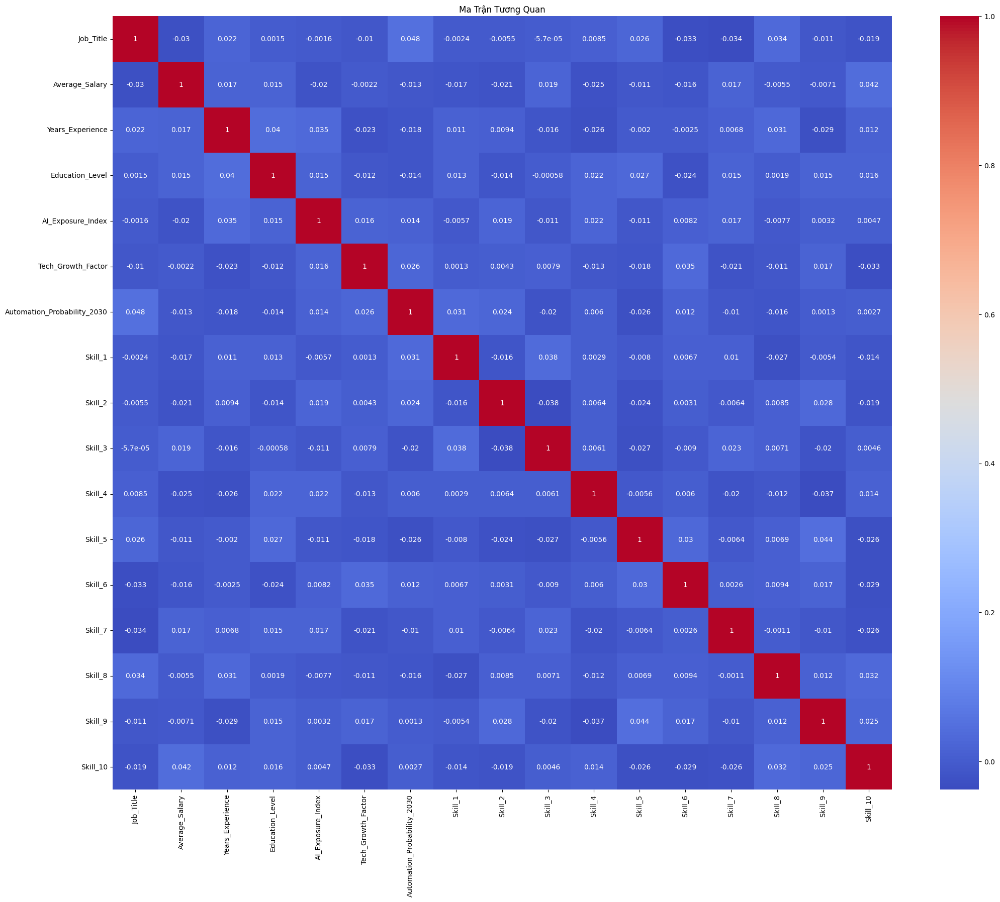

In [4]:
# Ma trận tương quan
corr = df.corr()
pyplot.figure(figsize=( 25 , 20))
seaborn.heatmap(corr , cmap="coolwarm" , annot=True)
pyplot.title("Ma Trận Tương Quan")
pyplot.show()

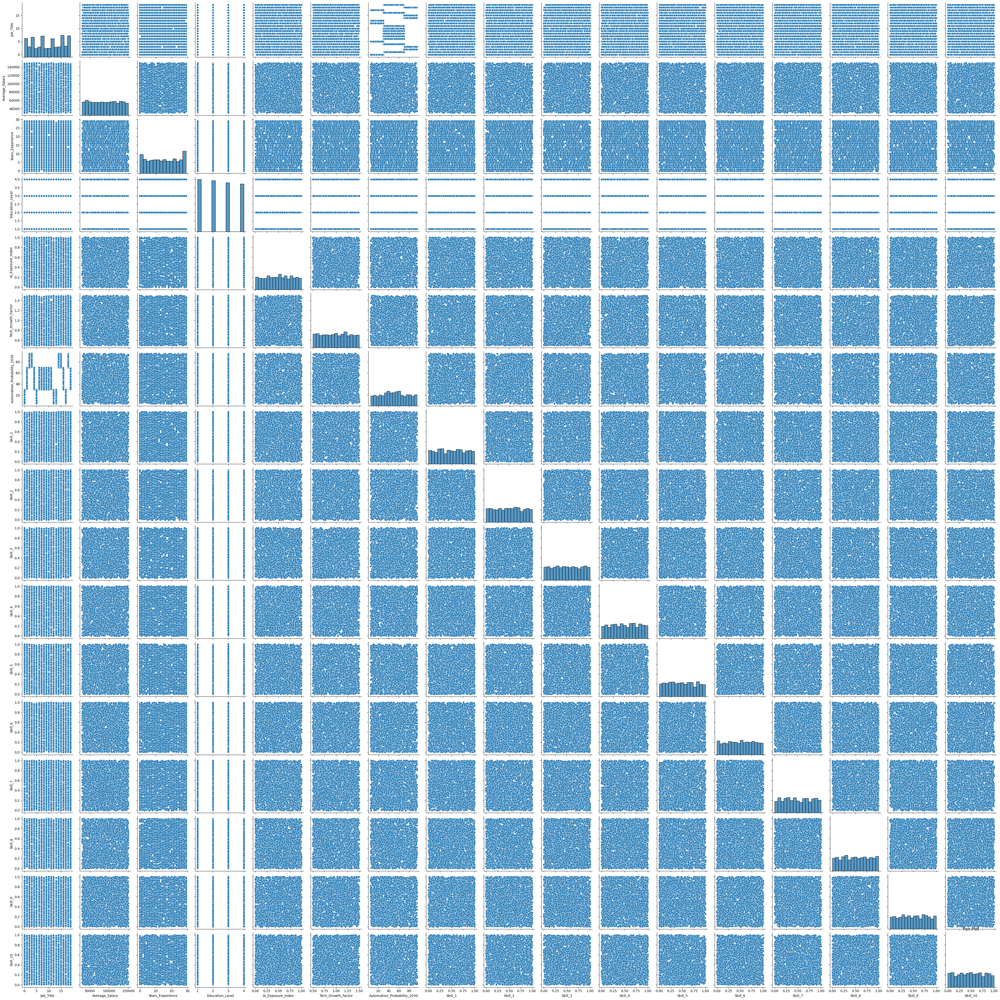

In [5]:
# Pair Plot
seaborn.pairplot(df)
pyplot.title("Pair Plot")
pyplot.show()

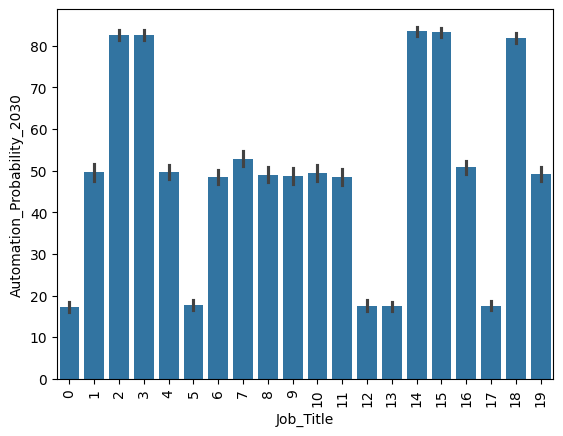

In [6]:
X_single = df[["Job_Title"]]
y = df['Automation_Probability_2030']

seaborn.barplot(data=df, x='Job_Title', y='Automation_Probability_2030')
pyplot.xticks(rotation=90)
pyplot.show()

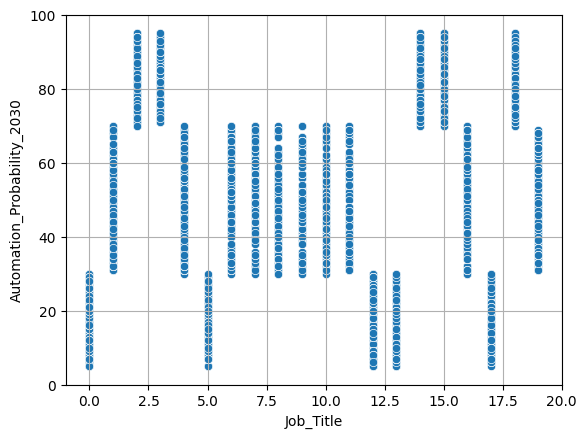

In [7]:
seaborn.scatterplot(data=df , x='Job_Title' , y='Automation_Probability_2030')
pyplot.axis([-1 , 20 , 0 , 100])
pyplot.grid()
pyplot.show()

c:\Users\admin\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


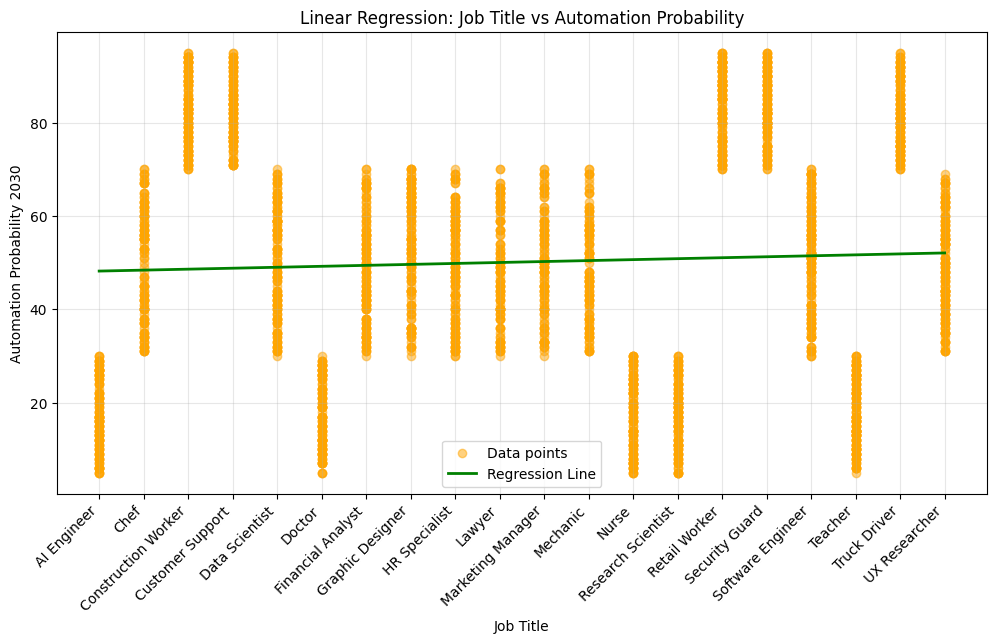

In [10]:
X_train , X_test , y_train , y_test = train_test_split(X_single , y , test_size=0.2 , random_state=42)

linear_model = LinearRegression()
linear_model.fit(X_single , y)

X_line = numpy.linspace(X_single.min(), X_single.max(), 100).reshape(-1, 1)
y_line = linear_model.predict(X_line)

pyplot.figure(figsize=(12, 6))
pyplot.scatter(df['Job_Title'], df['Automation_Probability_2030'], 
            alpha=0.5, color='orange', label='Data points')

pyplot.xticks(range(len(le.classes_)), le.classes_, rotation=45, ha='right')

# Regression line
pyplot.plot(X_line, y_line, color='green', linewidth=2, label='Regression Line')
pyplot.xlabel('Job Title')
pyplot.ylabel('Automation Probability 2030')
pyplot.title('Linear Regression: Job Title vs Automation Probability')
pyplot.legend()
pyplot.grid(True, alpha=0.3)
pyplot.show()